# Solar Radiation Prediction

**Data Description**

The actual solar radiation under a specific time was determined from laboaratory. Data is in raw form(not scaled). The data has 10 quantitative input variables, and 1 quantitaive output variable and 32686 instances (observations).

**Domain**

Envirnomental Aspects

**Context**

Radiation is the most important topic for envinoment as well as for human beings, The solar radiation prediction is a highly non linear function of age and ingredients. These ingredients include UNIX time, Data, Time, Temperature, Pressure, Humidity, WindDirection(Degrees), Speed, Time Sun Rise and Time Sun Set.

**Attribute Information**

* UNIXTime : Unix time is currently defined as the number of seconds which have passed since 00:00:00 UTC on Thursday, 1 January 1970, which is referred to as the Unix epoch.
* Data : measured in yyyy-mm-dd format 
* Time : measured in hh:mm:ss 24-hour format
* Radiation : measured in watts per meter^2
* Temperature : measured in degrees Fahrenheit
* Pressure : measured in Hg
* Humidity : measured in percent
* WindDirection(Degrees) : measured in degrees
* Speed : measured in miles per hour
* TimeSunRise/TimeSunSet : Hawaii time

**Objective**

Modeling of solar radiation of high performance prediction using Machine Learning

__________________________________________________________________________________________________________________________________________________________________________________________________

**importing the libraries**

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler , FunctionTransformer , OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')

**importing the data**

In [2]:
df = pd.read_csv(r"C:\Users\emran\Downloads\SolarPrediction.csv")
df.head()

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


**Summary of data**

In [3]:
df.shape

(32686, 11)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32686 entries, 0 to 32685
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   UNIXTime                32686 non-null  int64  
 1   Data                    32686 non-null  object 
 2   Time                    32686 non-null  object 
 3   Radiation               32686 non-null  float64
 4   Temperature             32686 non-null  int64  
 5   Pressure                32686 non-null  float64
 6   Humidity                32686 non-null  int64  
 7   WindDirection(Degrees)  32686 non-null  float64
 8   Speed                   32686 non-null  float64
 9   TimeSunRise             32686 non-null  object 
 10  TimeSunSet              32686 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 2.7+ MB


# Univariate Analysis

In [5]:
df.describe()

,UNIXTime,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed
count,3.268600e+04,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000
mean,1.478047e+09,207.124697,51.103255,30.422879,75.016307,143.489821,6.243869
std,3.005037e+06,315.916387,6.201157,0.054673,25.990219,83.167500,3.490474
min,1.472724e+09,1.110000,34.000000,30.190000,8.000000,0.090000,0.000000
25%,1.475546e+09,1.230000,46.000000,30.400000,56.000000,82.227500,3.370000
50%,1.478026e+09,2.660000,50.000000,30.430000,85.000000,147.700000,5.620000
75%,1.480480e+09,354.235000,55.000000,30.460000,97.000000,179.310000,7.870000
max,1.483265e+09,1601.260000,71.000000,30.560000,103.000000,359.950000,40.500000


In [6]:
fig = px.box(df, x="Radiation")
fig.show()

In [7]:
fig = px.box(df, x="Temperature")
fig.show()

In [8]:
fig = px.box(df, x="Pressure")
fig.show()

In [9]:
fig = px.box(df, x="Humidity")
fig.show()

In [10]:
fig = px.box(df, x="Speed")
fig.show()

In [11]:
fig = px.box(df, x="WindDirection(Degrees)")
fig.show()

*Conclusions that can be made out of it:*

* all the features given in the data are numeric expect last two is string
* There are no NULL or NaN values present in the data
* In total there are 10 features and 32686 observations
* We shall be using radiation as the dependent variable and all other features as independent variable as it makes the best sense out of the problem objective.
* from the plotly we can plotted and individual attribute's boxplots which were plotted before are the evidences that there are outliers present in the attributes: Radiation, Temperature, Pressure, Speed and WindDirection(Degrees)

________________________________________________________________________________________________________________________________________________________________________________

# Multivariate Analysis

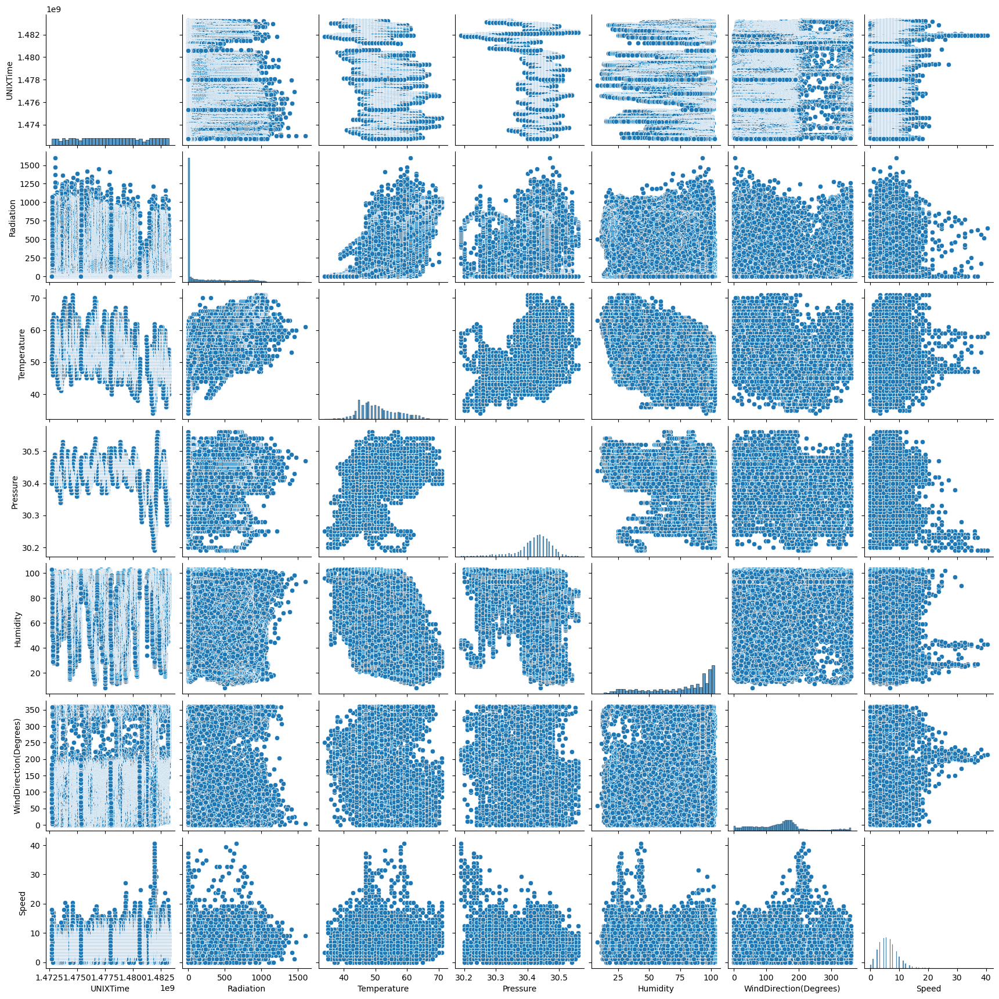

In [12]:
sns.pairplot(df)
plt.show()

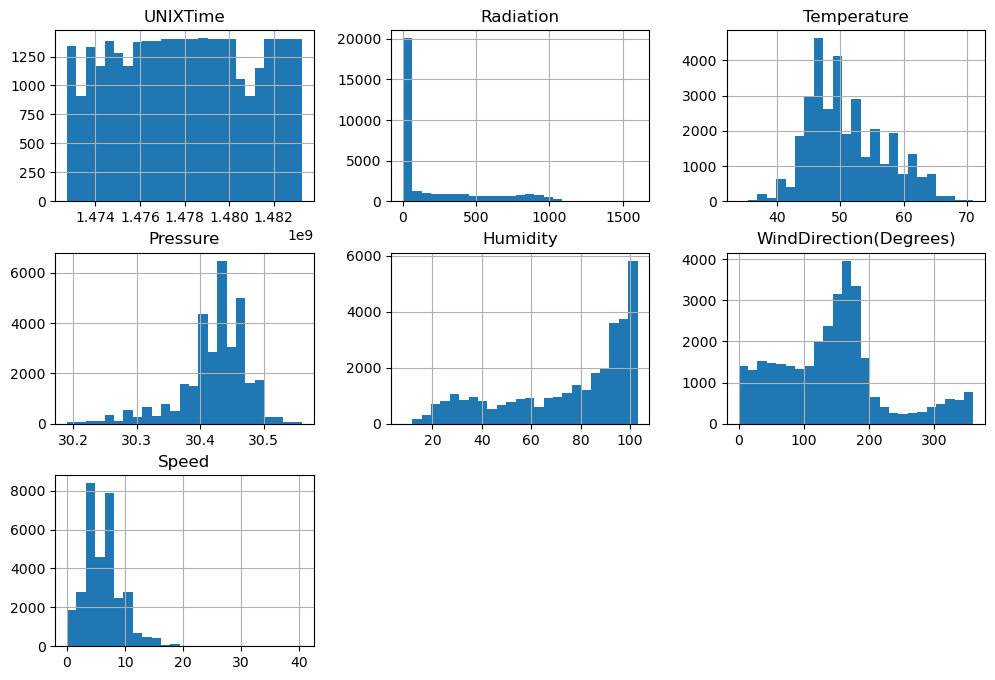

In [13]:
df.hist(bins=25, figsize=(12,8))
plt.show()

*Conclusion that can be drawn from bi-variate analysis:*

* Pressure, Humidity and WindDirection(Degrees) are the attributes which are rightly skewed.
* Temperature and Speed are the attributes which are rightly skewed.

# Split the Data

In [14]:
df['Temperature_cat'] = pd.cut(df['Temperature'], bins=[30, 35, 40, 45, 50, 55, 60, 65, 70, np.inf], 
                               labels=[1, 2, 3, 4, 5, 6, 7, 8, 9])
df.head()

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet,Temperature_cat
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00,4
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00,4
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00,4
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00,4
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00,4


In [15]:
from sklearn.model_selection import train_test_split
strat_train, strat_test = train_test_split(df, test_size=0.3, stratify=df["Temperature_cat"], random_state=42)

In [16]:
strat_train.drop("Temperature_cat", axis=1, inplace=True)
strat_test.drop("Temperature_cat", axis=1, inplace=True)

In [17]:
strat_train

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
16142,1475345723,10/1/2016 12:00:00 AM,08:15:23,478.06,54,30.47,101,125.48,2.25,06:13:00,18:11:00
3320,1474207504,9/18/2016 12:00:00 AM,04:05:04,1.26,52,30.43,100,140.35,2.25,06:11:00,18:23:00
14885,1475730020,10/5/2016 12:00:00 AM,19:00:20,1.26,53,30.46,99,109.39,2.25,06:14:00,18:08:00
30241,1481544633,12/12/2016 12:00:00 AM,02:10:33,1.30,48,30.36,96,184.64,5.62,06:48:00,17:45:00
22682,1478547602,11/7/2016 12:00:00 AM,09:40:02,714.93,62,30.47,14,307.83,5.62,06:27:00,17:46:00
...,...,...,...,...,...,...,...,...,...,...,...
5812,1473226832,9/6/2016 12:00:00 AM,19:40:32,2.40,50,30.41,100,71.93,3.37,06:08:00,18:34:00
450,1475092819,9/28/2016 12:00:00 AM,10:00:19,844.12,63,30.42,52,50.15,6.75,06:13:00,18:14:00
20890,1479085208,11/13/2016 12:00:00 AM,15:00:08,607.69,57,30.42,63,40.31,4.50,06:30:00,17:44:00
3233,1474234506,9/18/2016 12:00:00 AM,11:35:06,1020.61,62,30.48,63,35.59,4.50,06:11:00,18:23:00


In [18]:
strat_test

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
21029,1479043501,11/13/2016 12:00:00 AM,03:25:01,1.23,46,30.44,67,114.74,9.00,06:30:00,17:44:00
28029,1482210917,12/19/2016 12:00:00 AM,19:15:17,1.27,50,30.53,84,181.29,7.87,06:52:00,17:48:00
15172,1475642124,10/4/2016 12:00:00 AM,18:35:24,1.23,53,30.44,102,51.28,2.25,06:14:00,18:08:00
17764,1480023902,11/24/2016 12:00:00 AM,11:45:02,574.60,50,30.47,96,24.57,9.00,06:37:00,17:42:00
4902,1473648622,9/11/2016 12:00:00 AM,16:50:22,61.85,56,30.46,99,11.22,0.00,06:09:00,18:29:00
...,...,...,...,...,...,...,...,...,...,...,...
11738,1476693618,10/16/2016 12:00:00 AM,22:40:18,1.24,53,30.50,40,155.42,11.25,06:18:00,17:59:00
21226,1478984404,11/12/2016 12:00:00 AM,11:00:04,855.99,61,30.49,47,0.17,6.75,06:30:00,17:44:00
16239,1480482003,11/29/2016 12:00:00 AM,19:00:03,1.21,46,30.42,100,168.06,9.00,06:40:00,17:42:00
2479,1474468507,9/21/2016 12:00:00 AM,04:35:07,1.22,46,30.37,90,172.24,7.87,06:11:00,18:20:00


*Conclusion that can be drawn from split data:*

* Temperature attribute is more useful or important attribute to predict the solar radiation.
* training dataset should be representative of data.
* So we used stratified sampling and also split the data into 70% for training data and 30% for testing data.

# Relationship between dependent and independent variables

In [19]:
df = strat_train.copy()

In [20]:
df[["Radiation", "Temperature", "Pressure", "Humidity", "WindDirection(Degrees)", "Speed"]].corr()

,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed
Radiation,1.000000,0.734838,0.119656,-0.230079,-0.236012,0.068732
Temperature,0.734838,1.000000,0.309906,-0.289166,-0.262490,-0.034353
Pressure,0.119656,0.309906,1.000000,-0.223116,-0.231173,-0.084618
Humidity,-0.230079,-0.289166,-0.223116,1.000000,-0.005856,-0.207201
WindDirection(Degrees),-0.236012,-0.262490,-0.231173,-0.005856,1.000000,0.076832
Speed,0.068732,-0.034353,-0.084618,-0.207201,0.076832,1.000000


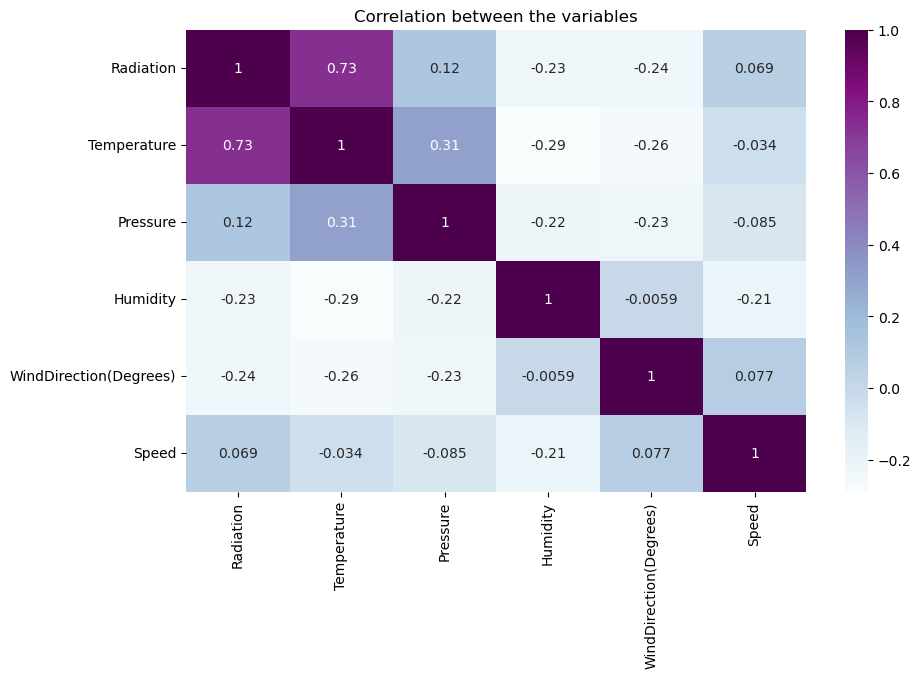

In [21]:
plt.figure(figsize=(10,6))
sns.heatmap(df[["Radiation", "Temperature", "Pressure", "Humidity", "WindDirection(Degrees)", "Speed"]].corr(), 
            annot= True, cmap='BuPu', linecolor='black')
plt.title("Correlation between the variables")
plt.show()

*Conclusion that can be drawn from relationship between dependent and independent variables:*

* Radiation vs Temperature: is highly positively correlated, it's also linearly related
* Radiation vs Pressure: is positively correalted with less degree of correaltion
* Radiation vs Humidity: is negatively correlated of almost -0.23
* Radiation vs WindDirection(Degrees): is negatively correlated of almost -0.24
* Radiation vs Speed: positive and fairly correalted of almost 0.069

**Make each attributes into Gausian distributions**

In [22]:
sy = PowerTransformer("yeo-johnson")
df1 = sy.fit_transform(df[["Temperature", "Pressure", "Humidity", "WindDirection(Degrees)", "Speed"]])

In [23]:
sy.lambdas_

array([ -0.90687409, 103.34959132,   1.88440102,   0.64001058,
         0.39502084])

**Check how much outliers is in the training set**

In [24]:
df2 = df[(df["Radiation"]>883.66)|(df["Radiation"]>883.66)|(df["Temperature"]>68) | (df["Pressure"]<30.31) | (df["Speed"]>14.62) | 
         (df["WindDirection(Degrees)"]>325.49)]

In [25]:
df2.shape

(3549, 11)

* There total 3549 outliers in the training set.
* But we don't remove this outliers because it is right information and also it will use full for predictions.

____________________________________________________________________________________________________________________________________________________________________________________

# Creating pipeline for data preprocessing

In [26]:
df = strat_train.drop("Radiation", axis=1)
df_labels = strat_train["Radiation"].copy()

In [27]:
num_pipeline = make_pipeline(SimpleImputer(strategy="median"), PowerTransformer("yeo-johnson"), StandardScaler())
preprocessing = ColumnTransformer([("num", num_pipeline, ["Temperature", "Pressure", "Humidity", "WindDirection(Degrees)",
                                                        "Speed"]),])

In [28]:
df_prepared = preprocessing.fit_transform(df)
df_prepared.shape

(22880, 5)

In [29]:
preprocessing.get_feature_names_out()

array(['num__Temperature', 'num__Pressure', 'num__Humidity',
       'num__WindDirection(Degrees)', 'num__Speed'], dtype=object)

*In this pipeline we used imputation if there is filling value, converting attributes into gauisan distribution and scaling variables.*

# Select and train model

**Algorithm**:- *Linear Regression*

In [30]:
from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(df, df_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('powertransformer',
                                                                   PowerTransformer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Temperature', 'Pressure',
                                                   'Humidity',
                                                   'WindDirection(Degrees)',
                                                   'Speed'])])),
                ('linearregression', LinearRegression())])

In [31]:
lin_predictions = lin_reg.predict(df)
lin_predictions[:5].round(2)

array([221.76, 188.57, 209.29, 122.75, 502.77])

In [32]:
df_labels.iloc[:5]

16142    478.06
3320       1.26
14885      1.26
30241      1.30
22682    714.93
Name: Radiation, dtype: float64

In [33]:
lin_rmse = mean_squared_error(df_labels, lin_predictions, squared=False)
print("RMSE: ", lin_rmse)

RMSE:  216.8281523605411


In [34]:
from sklearn import metrics
lin_reg_r2 = metrics.r2_score(df_labels, lin_predictions)
print("R^2 Score:", lin_reg_r2)
print("Mean Squared Error:", metrics.mean_squared_error(df_labels, lin_predictions))

R^2 Score: 0.5277847910024549
Mean Squared Error: 47014.447656086035


**Algorithm**:- *Decision Tree Regressor*

In [35]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor())
tree_reg.fit(df, df_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('powertransformer',
                                                                   PowerTransformer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Temperature', 'Pressure',
                                                   'Humidity',
                                                   'WindDirection(Degrees)',
                                                   'Speed'])])),
                ('decisiontreeregressor', DecisionTreeRegressor())])

In [36]:
tree_predictions = tree_reg.predict(df)
tree_rmse = mean_squared_error(df_labels, tree_predictions)
tree_rmse

1.4669576617132865

*RMSE is 1.47 but training data overfit the model so we used validation set i.e cross validation method for evaluating the model.*

In [37]:
tree_rmses = -cross_val_score(tree_reg, df, df_labels, cv=10, scoring="neg_root_mean_squared_error")
pd.Series(tree_rmses).describe()

count     10.000000
mean     223.978098
std        4.732684
min      214.976610
25%      221.601141
50%      225.308988
75%      227.295367
max      230.182094
dtype: float64

In [38]:
tree_reg_r2 = metrics.r2_score(df_labels, tree_predictions)
print("R^2 Score:", tree_reg_r2)
print("Mean Squared Error:", metrics.mean_squared_error(df_labels, tree_predictions))

R^2 Score: 0.9999852658118227
Mean Squared Error: 1.4669576617132865


**Algorithm**:- *Support Vector Regressor*

In [39]:
from sklearn.svm import SVR

svr_reg = make_pipeline(preprocessing, SVR())
svr_reg.fit(df, df_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('powertransformer',
                                                                   PowerTransformer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Temperature', 'Pressure',
                                                   'Humidity',
                                                   'WindDirection(Degrees)',
                                                   'Speed'])])),
                ('svr', SVR())])

In [40]:
svr_rmses = -cross_val_score(tree_reg, df, df_labels, cv=10, scoring="neg_root_mean_squared_error")
pd.Series(svr_rmses).describe()

count     10.000000
mean     224.281274
std        4.451574
min      214.513426
25%      223.680947
50%      224.223969
75%      224.940508
max      232.749604
dtype: float64

In [41]:
svr_predictions = svr_reg.predict(df)

In [42]:
svr_reg_r2 = metrics.r2_score(df_labels, svr_predictions)
print("R^2 Score:", svr_reg_r2)
print("Mean Squared Error:", metrics.mean_squared_error(df_labels, svr_predictions))

R^2 Score: 0.5799059373816831
Mean Squared Error: 41825.188899631714


**Algorithm**:- *Random Forest Regressor*

In [43]:
from sklearn.ensemble import RandomForestRegressor

rnd_reg = make_pipeline(preprocessing, RandomForestRegressor())
rnd_reg.fit(df, df_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('powertransformer',
                                                                   PowerTransformer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Temperature', 'Pressure',
                                                   'Humidity',
                                                   'WindDirection(Degrees)',
                                                   'Speed'])])),
                ('randomforestregressor', RandomForestRegressor())])

In [44]:
rnd_rmses = -cross_val_score(rnd_reg, df, df_labels, cv=10, scoring="neg_root_mean_squared_error")
pd.Series(rnd_rmses).describe()

count     10.000000
mean     161.780688
std        4.883071
min      153.640518
25%      160.361808
50%      162.582172
75%      165.162797
max      168.730451
dtype: float64

In [45]:
rnd_predictions = rnd_reg.predict(df)
rnd_rmse=mean_squared_error(df_labels, rnd_predictions, squared=False)
rnd_rmse

60.234891930675836

In [46]:
rnd_reg_r2 = metrics.r2_score(df_labels, rnd_predictions)
print("R^2 Score:", rnd_reg_r2)
print("Mean Squared Error:", metrics.mean_squared_error(df_labels, rnd_predictions))

R^2 Score: 0.9635577734724043
Mean Squared Error: 3628.242205900197


In [47]:
rnd_predictions[:5].round(2)

array([300.76,   3.65,  13.41,   1.32, 708.85])

*Conclusion that can be drawn from model selection:*

* Random Forest Regressor is the best model for this because mean of rmses is very low compare to other.
* So we will hyperparameter tune to random forest regressor.

**Hyper Parameter Tuning of Random Forest Regressor**

In [48]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.pipeline import Pipeline

full_pipeline = Pipeline([("preprocessing", preprocessing), ("random_forest", RandomForestRegressor(random_state=42))])

param_distribs = {'random_forest__max_features': randint(low=0, high=6), 
                  'random_forest__n_estimators': randint(low=0, high=200),
                 'random_forest__max_depth': randint(low=0, high=100),
                 'random_forest__bootstrap': [True, False]}

rnd_search = RandomizedSearchCV(full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3, 
                               scoring="neg_root_mean_squared_error")
rnd_search.fit(df, df_labels)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('powertransformer',
                                                                                                PowerTransformer()),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               ['Temperature',
                                                                                'Pressure',
                                                                                'Humidity',
                                                                                'WindDirection(Degrees)',
                                                                                'Speed'])])),
                                             ('random_forest',
                                              RandomF...
                                        'random_forest__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000170D82A5FC0>,
                                        'random_forest__max_features': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000170D826FFA0>,
                                        'random_forest__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000170D81A7400>},
                   scoring='neg_root_mean_squared_error')

In [49]:
rnd_search.best_params_

{'random_forest__bootstrap': True,
 'random_forest__max_depth': 63,
 'random_forest__max_features': 4,
 'random_forest__n_estimators': 184}

In [50]:
-rnd_search.best_score_

163.04952407959578

*We used randomizedsearchcv because it help to find the best parameters for fixed range.*

_____________________________________________________________________________________________________________________________________________________________________________________

**Final model**

In [51]:
final_model = rnd_search.best_estimator_
final_model

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('powertransformer',
                                                                   PowerTransformer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Temperature', 'Pressure',
                                                   'Humidity',
                                                   'WindDirection(Degrees)',
                                                   'Speed'])])),
                ('random_forest',
                 RandomForestRegressor(max_depth=63, max_features=4,
                                       n_estimators=184, random_state=42))])

In [52]:
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

array([0.57, 0.07, 0.12, 0.18, 0.06])

In [53]:
sorted(zip(feature_importances, final_model["preprocessing"].get_feature_names_out()), reverse=True)

[(0.5682408643067031, 'num__Temperature'),
 (0.1795600105116454, 'num__WindDirection(Degrees)'),
 (0.12115153366906277, 'num__Humidity'),
 (0.07334057647537502, 'num__Pressure'),
 (0.057707015037213566, 'num__Speed')]

# Evaluate in test set

In [54]:
X_test = strat_test.drop("Radiation", axis=1)
y_test = strat_test["Radiation"].copy()

final_predictions = final_model.predict(X_test)

final_rmse = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse)

160.35550024775324


In [55]:
final_model_r2 = metrics.r2_score(y_test, final_predictions)
print("R^2 Score:", final_model_r2)

R^2 Score: 0.7437716218280461


In [57]:
print(f"Accuracy of Hyperparameter tuned Random Forest Regressor is {100*final_model_r2}%.")

Accuracy of Hyperparameter tuned Random Forest Regressor is 74.37716218280461%.


*We can conclude that RMSE is low for test data so it show that it is generalized and R squared is 0.74 so we can say that 74% is the accuracy of our hyperparameter tune Random Forest Regressor model.*

In [58]:
from scipy import stats

confidence = 0.95
squared_errors = (final_predictions - y_test) ** 2
np.sqrt(stats.t.interval(confidence, len(squared_errors) - 1,
                         loc=squared_errors.mean(),
                         scale=stats.sem(squared_errors)))

array([155.86617155, 164.7225227 ])

*You get a fairly large interval from 156 to 165, and your previous point estimate of 160 is roughly in the middle of it.*

*If you did a lot of hyperparameter tuning, the performance will usually be slightly worse than what you measured using cross-validation. That’s because your system ends up fine-tuned to perform well on the validation data and will likely not perform as well on unknown datasets. That’s not the case in this example since the test RMSE is lower than the validation RMSE, but when it happens you must resist the temptation to tweak the hyperparameters to make the numbers look good on the test set; the
improvements would be unlikely to generalize to new data.*